# Imports

In [1]:
from pytorchmodels.ObjectDetection import ObjectDetection
from lutils.general import seed_all
from datasets.RoboFlowFootballPlayers import RoboFlowFootballPlayers
from lutils.CreateStoredVideo import create_video_from_frames, create_video_from_sequential_frames
import torch
import numpy as np
import os
print(torch.__version__)
%load_ext autoreload
%autoreload 2
dataset_path = "./raw_dataset/footballPlayers/train/images"
seed_all(111)



c:\Python310\lib\site-packages\scipy\__init__.py:169: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


1.13.0+cpu


# Model Init

In [4]:
zidane_pic = 'https://ultralytics.com/images/zidane.jpg'
detector = ObjectDetection(capture=zidane_pic)

Using cache found in C:\Users\Youssef/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2024-10-16 Python-3.10.1 torch-1.13.0+cpu CPU

Fusing layers... 
YOLOv5n summary: 213 layers, 1867405 parameters, 0 gradients
Adding AutoShape... 


In [3]:
zidane_pic = 'https://ultralytics.com/images/zidane.jpg'
detector = ObjectDetection(capture=zidane_pic)
detector.model.info()

  0%|          | 0.00/5.35M [00:00<?, ?B/s]

YOLO11n summary: 319 layers, 2,624,080 parameters, 0 gradients, 6.6 GFLOPs


(319, 2624080, 0, 6.614336)

In [13]:
detector.CLASS_NAMES_DICT

{0: 'person',
 1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 4: 'airplane',
 5: 'bus',
 6: 'train',
 7: 'truck',
 8: 'boat',
 9: 'traffic light',
 10: 'fire hydrant',
 11: 'stop sign',
 12: 'parking meter',
 13: 'bench',
 14: 'bird',
 15: 'cat',
 16: 'dog',
 17: 'horse',
 18: 'sheep',
 19: 'cow',
 20: 'elephant',
 21: 'bear',
 22: 'zebra',
 23: 'giraffe',
 24: 'backpack',
 25: 'umbrella',
 26: 'handbag',
 27: 'tie',
 28: 'suitcase',
 29: 'frisbee',
 30: 'skis',
 31: 'snowboard',
 32: 'sports ball',
 33: 'kite',
 34: 'baseball bat',
 35: 'baseball glove',
 36: 'skateboard',
 37: 'surfboard',
 38: 'tennis racket',
 39: 'bottle',
 40: 'wine glass',
 41: 'cup',
 42: 'fork',
 43: 'knife',
 44: 'spoon',
 45: 'bowl',
 46: 'banana',
 47: 'apple',
 48: 'sandwich',
 49: 'orange',
 50: 'broccoli',
 51: 'carrot',
 52: 'hot dog',
 53: 'pizza',
 54: 'donut',
 55: 'cake',
 56: 'chair',
 57: 'couch',
 58: 'potted plant',
 59: 'bed',
 60: 'dining table',
 61: 'toilet',
 62: 'tv',
 63: 'laptop',
 64: 'mou

# Test Image 1

In [5]:
pred = detector.predict(detector.capture)
pred.pandas().xyxy[0]

,xmin,ymin,xmax,ymax,confidence,class,name
0,739.396790,40.245850,1155.810913,717.508728,0.784582,0,person
1,145.608124,187.211700,727.202271,719.957275,0.515544,0,person
2,435.916534,434.049866,502.311676,711.454407,0.281137,27,tie


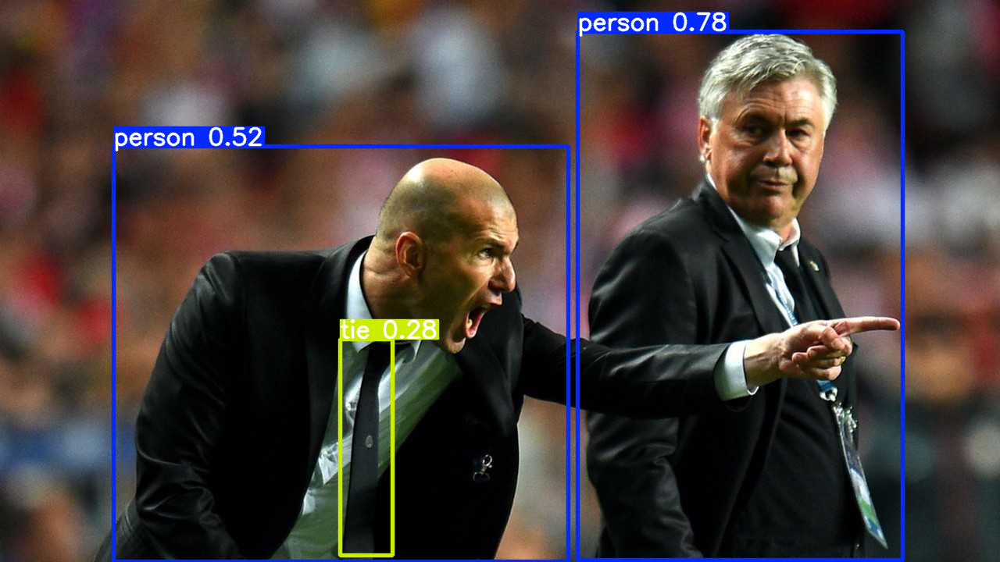

In [14]:
pred.show()

---

# Soccer Dataset

In [24]:
dataset = RoboFlowFootballPlayers()
sample_images = dataset.sample_images()
sample_images

[{'img': './raw_dataset/footballPlayers/train/images/121364_9_1_png.rf.fce77f2ce90193c230c29fa2a2ff910e.jpg',
  'label': './raw_dataset/footballPlayers/train/labels/121364_9_1_png.rf.fce77f2ce90193c230c29fa2a2ff910e.txt'},
 {'img': './raw_dataset/footballPlayers/train/images/2e57b9_9_2_png.rf.c5170dff135af720aca61d201a6a0794.jpg',
  'label': './raw_dataset/footballPlayers/train/labels/2e57b9_9_2_png.rf.c5170dff135af720aca61d201a6a0794.txt'},
 {'img': './raw_dataset/footballPlayers/train/images/538438_1_10_png.rf.57e17ba4f9876e6344791b647a50f4b7.jpg',
  'label': './raw_dataset/footballPlayers/train/labels/538438_1_10_png.rf.57e17ba4f9876e6344791b647a50f4b7.txt'},
 {'img': './raw_dataset/footballPlayers/train/images/2e57b9_3_1_png.rf.63b222ef60af250d104f28347c170459.jpg',
  'label': './raw_dataset/footballPlayers/train/labels/2e57b9_3_1_png.rf.63b222ef60af250d104f28347c170459.txt'},
 {'img': './raw_dataset/footballPlayers/train/images/54745b_7_9_png.rf.02afc595a2fafaba5a927907d2f33389.jp

In [25]:

image_paths = [sample['img'] for sample in sample_images]

i = detector.predict(image_paths)

In [28]:
i.pandas()

YOLOv5 <class 'models.common.Detections'> instance
image 1/5: 1280x1280 23 persons, 1 bottle
image 2/5: 1280x1280 17 persons
image 3/5: 1280x1280 24 persons
image 4/5: 1280x1280 19 persons
image 5/5: 1280x1280 18 persons
Speed: 16.6ms pre-process, 139.4ms inference, 2.0ms NMS per image at shape (5, 3, 640, 640)

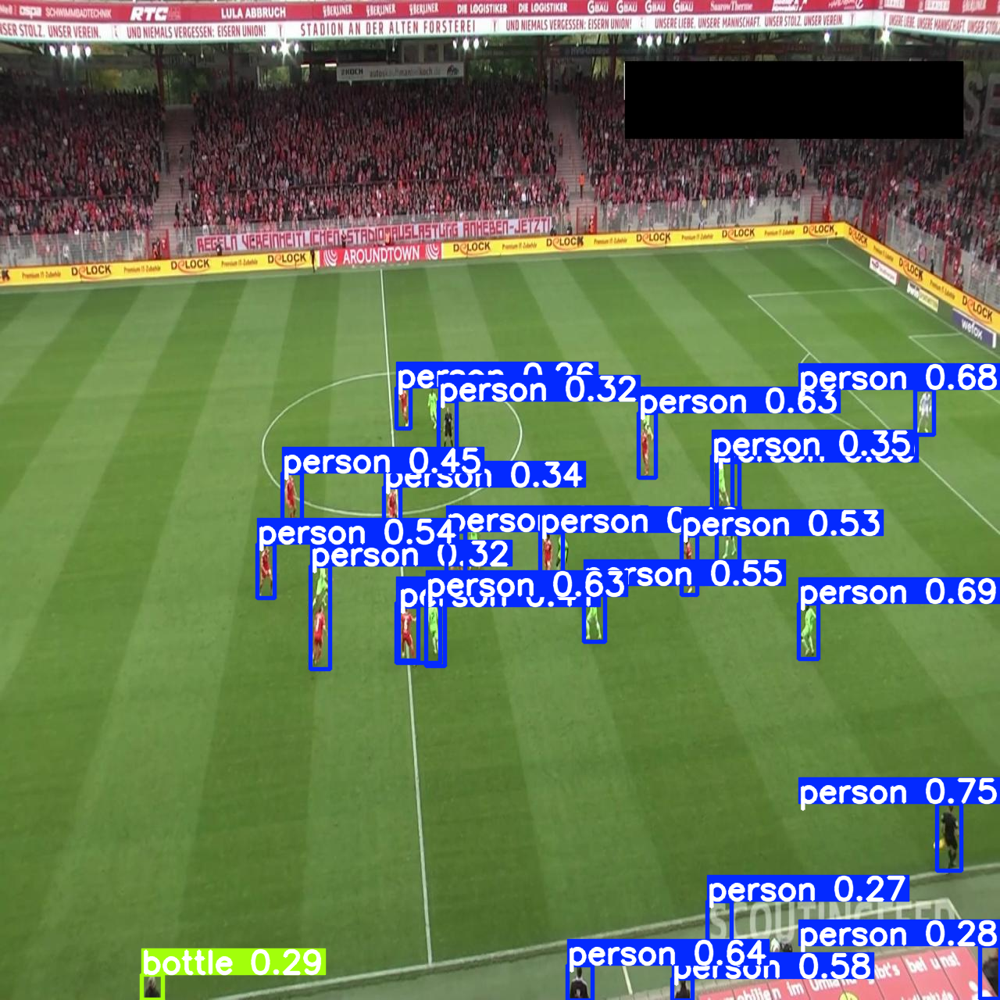

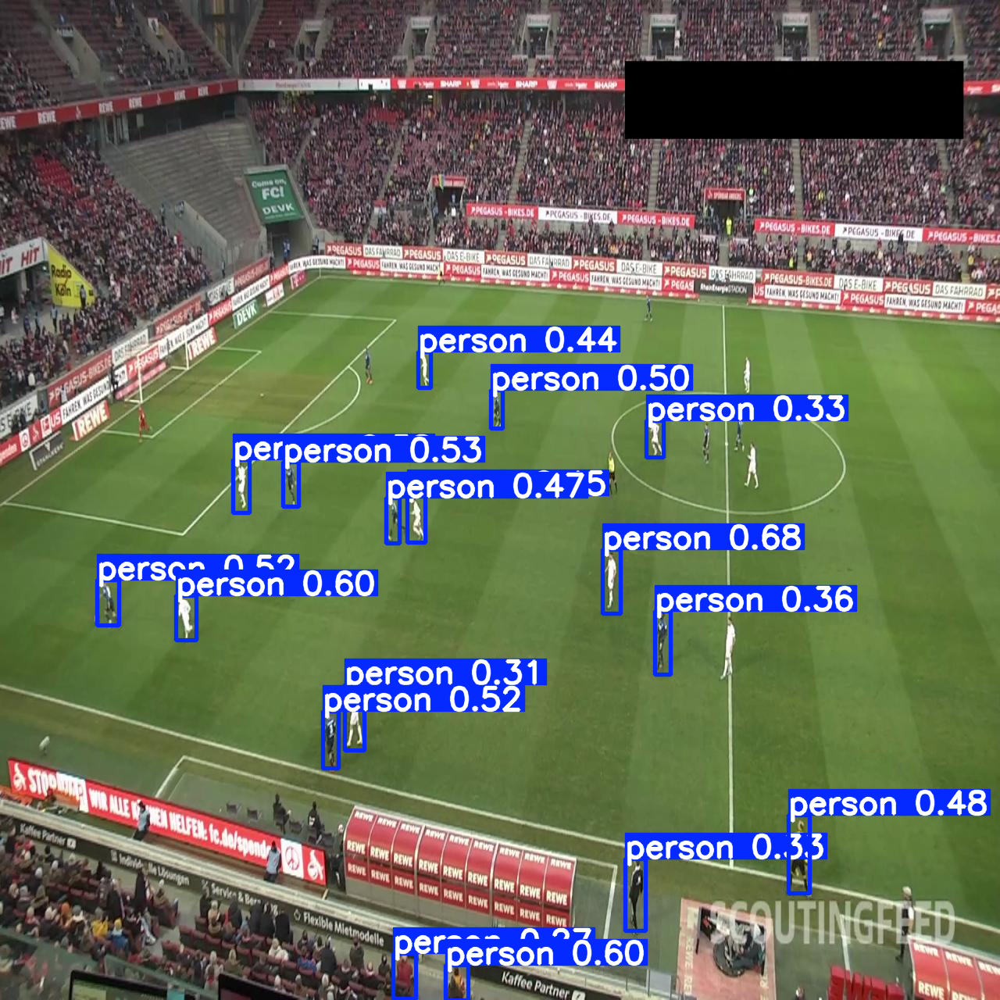

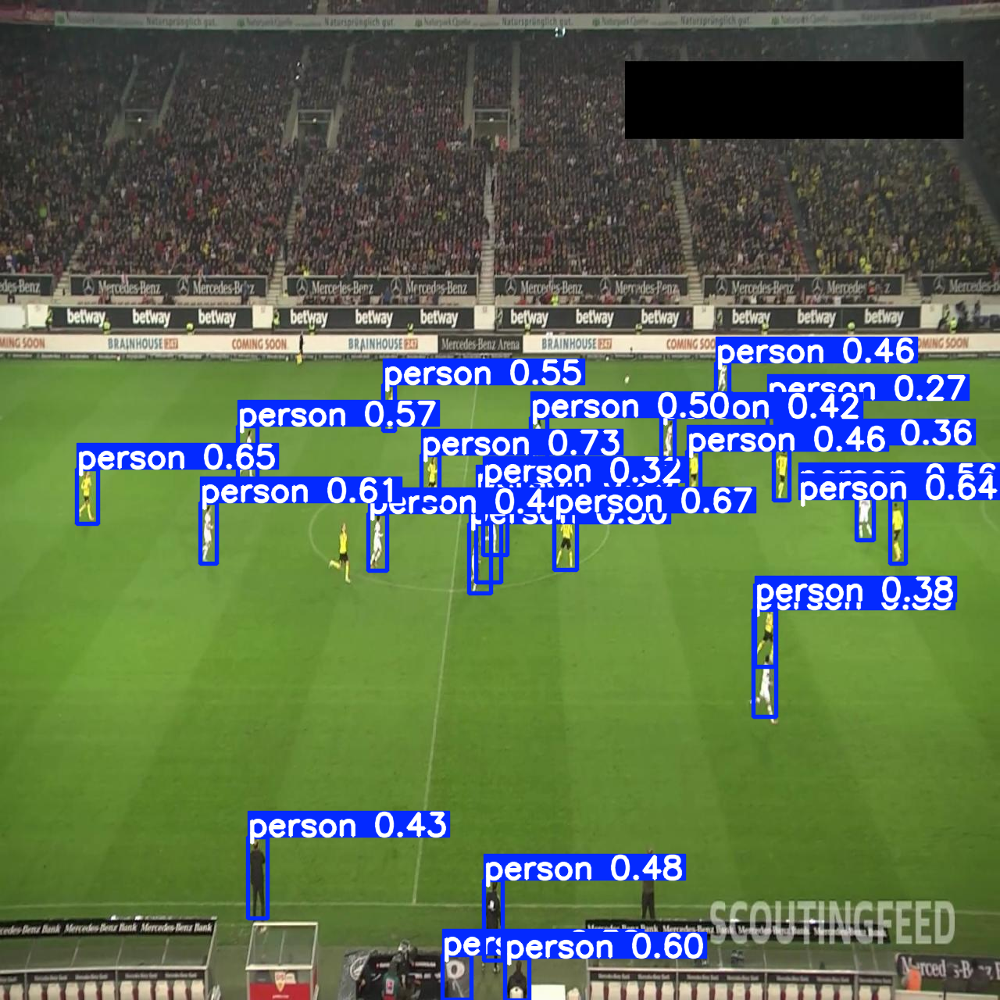

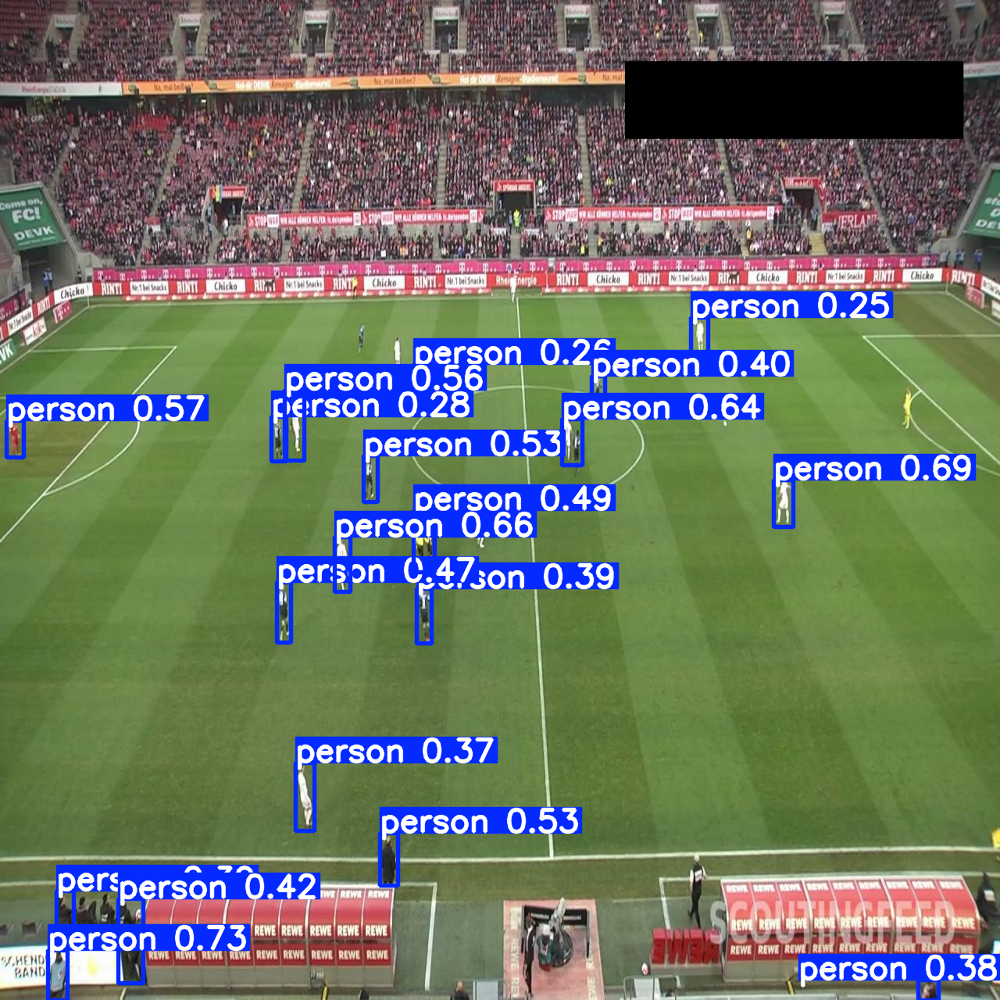

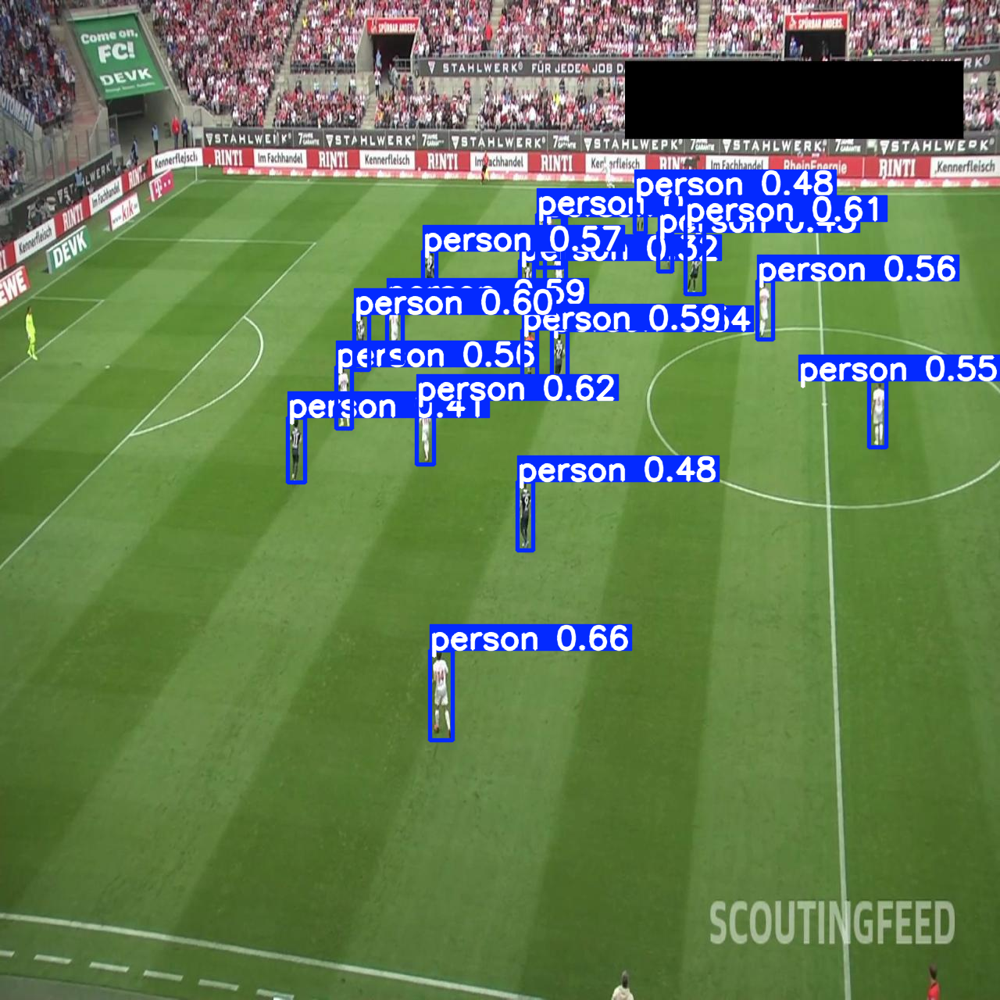

In [27]:
i.show()

# Calculate Metrics

In [29]:
#i.pandas()

YOLOv5 <class 'models.common.Detections'> instance
image 1/5: 1280x1280 23 persons, 1 bottle
image 2/5: 1280x1280 17 persons
image 3/5: 1280x1280 24 persons
image 4/5: 1280x1280 19 persons
image 5/5: 1280x1280 18 persons
Speed: 16.6ms pre-process, 139.4ms inference, 2.0ms NMS per image at shape (5, 3, 640, 640)

In [33]:
sample_images[0]

{'img': './raw_dataset/footballPlayers/train/images/121364_9_1_png.rf.fce77f2ce90193c230c29fa2a2ff910e.jpg',
 'label': './raw_dataset/footballPlayers/train/labels/121364_9_1_png.rf.fce77f2ce90193c230c29fa2a2ff910e.txt'}

---

# Videos

In [14]:
video_path = "./raw_dataset/videos/salah_ucl_2.mp4"
#detector.process_video_stored(video_path)
detector.process_video(video_path, write_path="../logs/outputframes/v11/salah_ucl_2")

Processing frames:   0%|          | 0/920 [00:00<?, ?frame/s]


0: 384x640 17 persons, 157.6ms
Speed: 5.0ms preprocess, 157.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 164.6ms
Speed: 3.0ms preprocess, 164.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 166.6ms
Speed: 18.9ms preprocess, 166.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 145.6ms
Speed: 3.0ms preprocess, 145.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 persons, 112.7ms
Speed: 3.0ms preprocess, 112.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 persons, 142.6ms
Speed: 4.0ms preprocess, 142.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 persons, 105.7ms
Speed: 2.0ms preprocess, 105.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 persons, 110.7ms
Speed: 3.0ms preprocess, 110.7ms inference, 2.0ms postpro

KeyboardInterrupt: 

: 

In [13]:
#create_video_from_frames(base_folder="../logs/outputVideo", output_video_path="../logs/saved_video.mp4")
# # Usage example
base_folder = '../logs/outputframes/v11/cody_gapko_2'  # Change to your folder path
output_video_path = '../logs/outputVideos/v11/cody_gapko_2.mp4'
# create_video_from_frames(base_folder, output_video_path)
create_video_from_sequential_frames(base_folder,output_video_path)